# Setup

In [1]:
from torchcfm.conditional_flow_matching import *
from torchcfm.models.models import *
from torchcfm.utils import *

import numpy as np
import matplotlib.pyplot as plt

def plot_trajectories(traj=None, x0=None, title="Trajectory Visualization", pca=None):
    """Plot trajectories of some selected samples and optionally original x0 points."""
    n = 1024
    plt.figure(figsize=(6, 6))

    if traj is not None:
        # Plot initial Gaussian samples
        plt.scatter(traj[0, :n, 0], traj[0, :n, 1], s=6, alpha=0.8, c="black", label="Gaussian Source")

        if x0 is not None:
            x0 = x0[:n]

        # Loop through each trajectory
        for i in range(n):
            final_point = traj[-1, i]
            if x0 is not None:
                # Compute L2 distance to all x0[:n]
                dists = np.linalg.norm(x0 - final_point, axis=1)
                min_dist = np.min(dists)
            else:
                min_dist = 0  # Default to 0 if x0 is not provided

            color = "lightsteelblue" if min_dist <= 1 else "indianred"
            ss = 1 if min_dist <= 1 else 0.3
            alpha = 0.5 if min_dist <= 1 else 0.2

            # Plot trajectory
            plt.scatter(traj[:, i, 0], traj[:, i, 1], alpha=0.2, color=color, s=ss)

        # Plot final points
        plt.scatter(traj[-1, :n, 0], traj[-1, :n, 1], s=4, alpha=1, c="red", label="Model Output")

    if x0 is not None:
        plt.scatter(x0[:, 0], x0[:, 1], s=4, alpha=0.8, c="blue", label="Data")

    if pca is not None:
        axis0 = pca.components_[0]
        axis1 = pca.components_[1]
        origin = np.mean(x0, axis=0)
        plt.quiver(0, 0, axis0[0], axis0[1], scale=3, color='green', label='PCA Axis 1')
        plt.quiver(0, 0, axis1[0], axis1[1], scale=3, color='orange', label='PCA Axis 2')
        plt.scatter(0, 0, s=20, c='black', label='PCA Origin')

    plt.legend(loc='upper left', fontsize=20, markerscale=3)
    plt.xticks([])
    plt.yticks([])
    plt.axis('equal')
    plt.tight_layout()
    plt.show()


In [2]:
import math
import torch
import time
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
from torchdyn.core import NeuralODE
from torch.distributions.chi2 import Chi2

def sample_circle(num_samples):
    theta = torch.rand(num_samples) * 2 * torch.pi
    df = 3072
    chi2 = Chi2(df)
    radius = torch.sqrt(chi2.sample((num_samples,)))
    x = radius * torch.cos(theta)
    y = radius * torch.sin(theta)
    points = torch.stack([x, y], dim=1)
    return points

def sample_circle_directions(base_angles, num_samples=200, direction_ratios=[0.05, 0.3, 0.65], angle_offset_deg=10.0):
    assert abs(sum(direction_ratios) - 1.0) < 1e-6, "direction_ratios must sum to 1.0"
    num_directions = len(direction_ratios)
    df = 625
    chi2 = Chi2(df)
    counts = [int(round(r * num_samples)) for r in direction_ratios]
    diff = num_samples - sum(counts)
    if diff != 0:
        max_idx = torch.tensor(direction_ratios).argmax().item()
        counts[max_idx] += diff
    angle_offset = torch.deg2rad(torch.tensor(angle_offset_deg))
    all_points = []
    for base_angle, count in zip(base_angles, counts):
        if count == 0:
            continue
        # Add small random perturbation to the angles
        angles = base_angle + torch.linspace(-angle_offset, angle_offset, count)
        random_perturbation = torch.randn(count) * (angle_offset * 0.1)  # 10% of offset as random noise
        angles = angles + random_perturbation
        radius = torch.sqrt(chi2.sample((count,)))
        x = radius * torch.cos(angles)
        y = radius * torch.sin(angles)
        points = torch.stack([x, y], dim=1)
        all_points.append(points)
    return torch.cat(all_points, dim=0)

# Assuming these are defined elsewhere in your codebase
from torchcfm.conditional_flow_matching import ExactOptimalTransportConditionalFlowMatcher
from torchcfm.models.models import MLP
from torchcfm.utils import torch_wrapper

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

sigma = 0
dim = 2
batch_size = 16
total_samples = 1024
torch.manual_seed(124142)

# Pre-generate fixed x1 dataset
base_angles = torch.rand(3) * 2 * torch.pi
fixed_x1 = sample_circle_directions(base_angles, total_samples).to(device)

model = MLP(dim=dim, time_varying=True).to(device)
optimizer = torch.optim.Adam(model.parameters())

Using device: cpu


/home/kwanseok/.conda/envs/source/lib/python3.10/site-packages/torch/cuda/__init__.py:716: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [3]:
base_angles

tensor([4.4956, 5.9167, 1.1018])

In [ ]:
# Calculate PCA axis from fixed_x1
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(fixed_x1.cpu().numpy())

# rejection sampling based on pca axis - reject points that are close to the second pca axis
def sample_circle_rejection(num_samples, pca, rejection_threshold=0.9):
    points = []
    while len(points) < num_samples:
        point = sample_circle(1)
        axis = pca.components_[1]
        axis = torch.tensor(axis).to(device)
        # normalize the pca axis and the point
        if torch.abs(torch.dot(point.squeeze(0).to(device) / torch.norm(point), axis / torch.norm(axis))) <= rejection_threshold:
            points.append(point)
    return torch.cat(points, dim=0)

PCA(n_components=2)

## Metrics

In [ ]:
def calculate_distance_metrics(generated, real, threshold=1.0):
    """Returns: (avg_min_dist, %_samples_above_threshold)"""
    dist_matrix = np.linalg.norm(real[:, None] - generated, axis=2)
    min_dists = np.min(dist_matrix, axis=0)
    return np.mean(min_dists), (min_dists > threshold).mean()*100

from scipy.stats import wasserstein_distance

def wasserstein_metric(generated, real):
    return wasserstein_distance(generated.ravel(), real.ravel())

import ot
import numpy as np

def wasserstein_distance(x, y):
    n, m = len(x), len(y)
    a = np.ones(n) / n  # uniform distribution over x
    b = np.ones(m) / m  # uniform distribution over y
    cost_matrix = ot.dist(x, y)  # equivalent to c[i,j] = ||x_i - y_j||_2
    w2_distance = ot.emd2(a, b, cost_matrix)
    return np.sqrt(w2_distance)  # emd2 returns squared distance

def coverage_precision(generated, real, epsilon=0.5):
    # Precision: % generated near real data
    dist_matrix = np.linalg.norm(real[:, None] - generated, axis=2)
    precision = (np.min(dist_matrix, axis=0) < epsilon).mean()
    
    # Coverage: % real data near generated
    coverage = (np.min(dist_matrix, axis=1) < epsilon).mean()
    return coverage, precision

def coverage_precision_no_replacement(generated, real, epsilon=0.5):
    dist_matrix = np.linalg.norm(real[:, None] - generated, axis=2)  # shape: (N_real, N_gen)

    # Find all pairs within epsilon
    valid_pairs = np.argwhere(dist_matrix < epsilon)

    # Precision: match generated → real (each real used at most once)
    used_real = set()
    used_gen = set()
    precision_matches = 0
    for i, j in valid_pairs:
        if j not in used_gen and i not in used_real:
            used_gen.add(j)
            used_real.add(i)
            precision_matches += 1
    precision = precision_matches / dist_matrix.shape[1]

    # Coverage: match real → generated (each generated used at most once)
    used_real = set()
    used_gen = set()
    coverage_matches = 0
    for i, j in valid_pairs:
        if i not in used_real and j not in used_gen:
            used_real.add(i)
            used_gen.add(j)
            coverage_matches += 1
    coverage = coverage_matches / dist_matrix.shape[0]

    return coverage, precision

def mmd(x, y, sigma=1.0):
    gamma = 1/(2*sigma**2)
    xx = np.exp(-gamma * np.linalg.norm(x[:,None]-x, axis=2)**2)
    yy = np.exp(-gamma * np.linalg.norm(y[:,None]-y, axis=2)**2)
    xy = np.exp(-gamma * np.linalg.norm(x[:,None]-y, axis=2)**2)
    return xx.mean() + yy.mean() - 2*xy.mean()

In [ ]:
from torchcfm.conditional_flow_matching import *
from torchcfm.models.models import *
from torchcfm.utils import *

import numpy as np
import matplotlib.pyplot as plt

def plot_trajectories(traj=None, x0=None, title="Trajectory Visualization", pca=None, epsilon=1, threshold=1, sigma=1.0):
    """Plot trajectories of some selected samples and optionally original x0 points."""
    n = 1024
    plt.figure(figsize=(6, 6))

    if traj is not None:
        # Plot initial Gaussian samples
        plt.scatter(traj[0, :n, 0], traj[0, :n, 1], s=6, alpha=0.8, c="black", label="Source")

        if x0 is not None:
            x0 = x0[:n]

        # Loop through each trajectory
        for i in range(n):
            final_point = traj[-1, i]
            if x0 is not None:
                # Compute L2 distance to all x0[:n]
                dists = np.linalg.norm(x0 - final_point, axis=1)
                min_dist = np.min(dists)
            else:
                min_dist = 0  # Default to 0 if x0 is not provided

            color = "lightsteelblue" if min_dist <= 1 else "indianred"
            ss = 1 if min_dist <= 1 else 0.3
            alpha = 0.5 if min_dist <= 1 else 0.2

            # Plot trajectory
            plt.scatter(traj[:, i, 0], traj[:, i, 1], alpha=0.2, color=color, s=ss)

        # Plot final points
        plt.scatter(traj[-1, :n, 0], traj[-1, :n, 1], s=4, alpha=1, c="red", label="Generated")

    if x0 is not None:
        plt.scatter(x0[:, 0], x0[:, 1], s=4, alpha=0.8, c="blue", label="Data")

    # Calculate Matrices
    avg_dist, pct_bad = calculate_distance_metrics(traj[-1], x0, threshold)
    # wx = wasserstein_distance(traj[-1,:,0], x0[:,0])
    # wy = wasserstein_distance(traj[-1,:,1], x0[:,1])
    w2 = wasserstein_distance(traj[-1], x0)
    # coverage, precision = coverage_precision(traj[-1], x0, epsilon)
    coverage, precision = coverage_precision_no_replacement(traj[-1], x0, epsilon)
    mmd_score = mmd(traj[-1], x0, sigma)


    plt.legend(loc='upper left', fontsize=20, markerscale=3)
    plt.xticks([])
    plt.yticks([])
    plt.axis('equal')
    plt.tight_layout()
    # plt.text(0.95, 0.95, f"Avg dist: {avg_dist:.2f}\n% bad samples: {pct_bad:.1f}%\nWasserstein X: {wx:.2f}\nWasserstein Y: {wy:.2f}\nCoverage: {coverage:.2f}\nPrecision: {precision:.2f}\nMMD: {mmd_score:.4f}", 
    #          transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.7))
    plt.show()

    return [avg_dist, pct_bad, w2, coverage, precision, mmd_score]

# Figures

## Fig 1.

### (a) Gaussian to Guassian

In [ ]:
fixed_gaussian = torch.randn(total_samples, dim).to(device)

In [ ]:
base_model = MLP(dim=dim, time_varying=True).to(device)
base_optimizer = torch.optim.Adam(base_model.parameters())

 25%|██▍       | 4935/20000 [00:06<00:21, 699.57it/s]

5000: loss 1.620 time 7.01


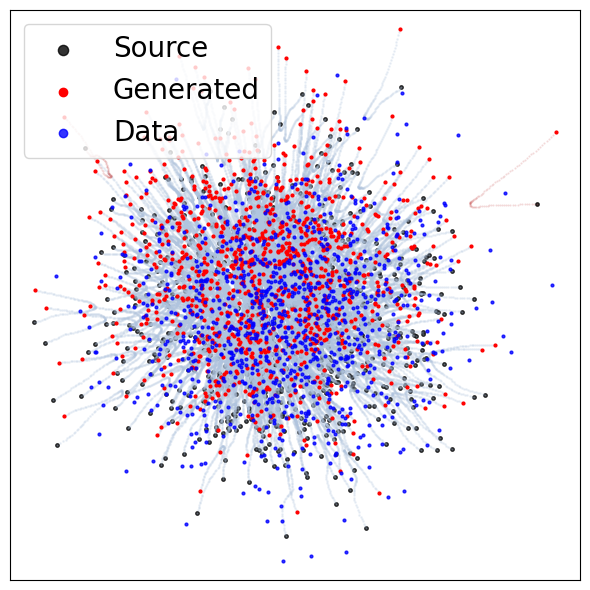

 25%|██▌       | 5075/20000 [00:15<06:22, 39.05it/s] 

Metrics:
AMD: 0.0858
Percentage of bad samples (MD > eps): 0.20%
Wasserstein distance: 0.6173
Coverage: 0.9648
MMD score: 0.037077


 50%|████▉     | 9998/20000 [00:22<00:14, 710.97it/s]

10000: loss 2.632 time 15.20


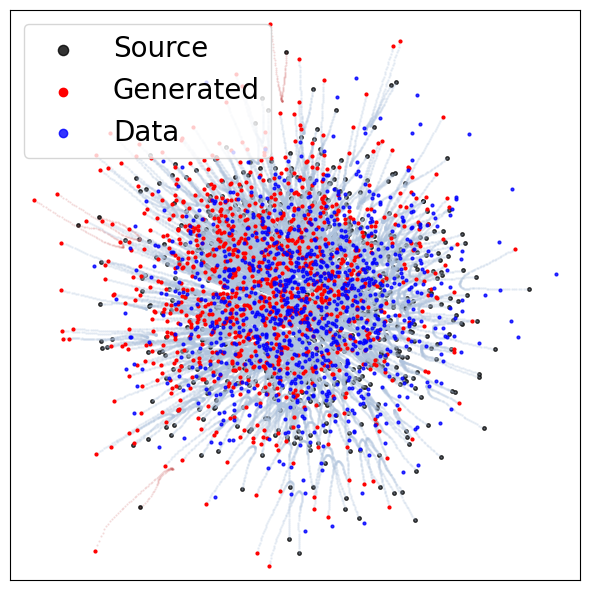

 50%|█████     | 10070/20000 [00:30<05:33, 29.76it/s]

Metrics:
AMD: 0.0984
Percentage of bad samples (MD > eps): 0.39%
Wasserstein distance: 0.6434
Coverage: 0.9561
MMD score: 0.040414


 75%|███████▍  | 14965/20000 [00:36<00:07, 706.45it/s]

15000: loss 1.317 time 14.83


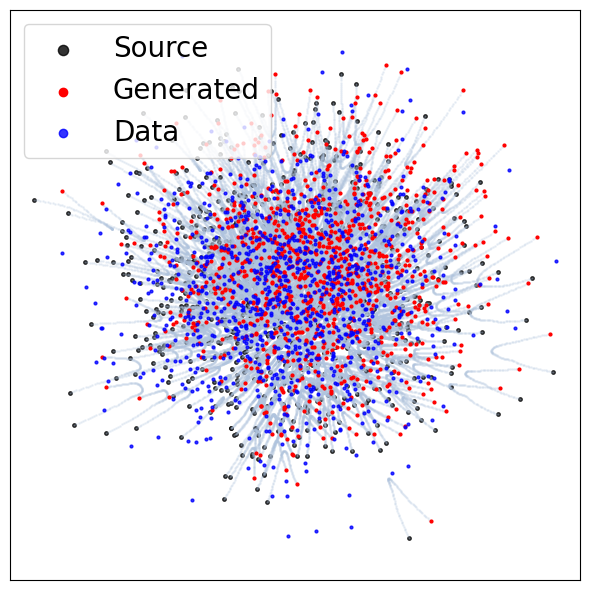

 76%|███████▌  | 15106/20000 [00:45<02:06, 38.69it/s] 

Metrics:
AMD: 0.0765
Percentage of bad samples (MD > eps): 0.00%
Wasserstein distance: 0.4707
Coverage: 0.9785
MMD score: 0.021574


100%|█████████▉| 19982/20000 [00:52<00:00, 701.68it/s]

20000: loss 1.053 time 15.36


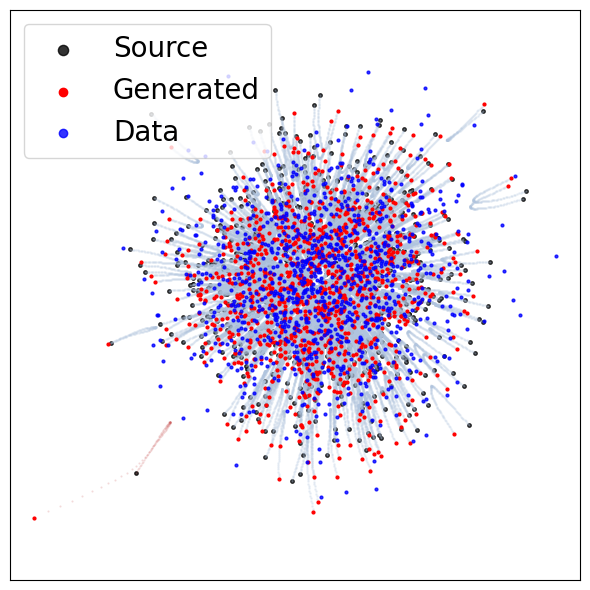

100%|██████████| 20000/20000 [01:00<00:00, 332.70it/s]

Metrics:
AMD: 0.0709
Percentage of bad samples (MD > eps): 0.10%
Wasserstein distance: 0.2351
Coverage: 0.9883
MMD score: 0.002157


In [ ]:
FM = ConditionalFlowMatcher(sigma=sigma)
start = time.time()

# Pre-initialize the NeuralODE to avoid recreating it in every iteration
static_node = NeuralODE(
    torch_wrapper(base_model), solver="dopri5", sensitivity="adjoint", atol=1e-4, rtol=1e-4
)

for k in tqdm(range(20000)):
    optimizer.zero_grad()
    indices = torch.randperm(total_samples)[:batch_size]

    x0 = torch.randn(batch_size, dim).to(device)  # Sample random points in the circle
    x1 = fixed_gaussian[indices].to(device)

    # Move these operations outside the device assignment for better efficiency
    t, xt, ut = FM.sample_location_and_conditional_flow(x0, x1)
    
    # Use torch.cat once instead of creating intermediate tensors
    vt = model(torch.cat([xt, t[:, None]], dim=-1))
    loss = torch.mean((vt - ut) ** 2)

    loss.backward()
    optimizer.step()

    if (k + 1) % 5000 == 0:
        end = time.time()
        print(f"{k+1}: loss {loss.item():0.3f} time {(end - start):0.2f}")
        start = end
        
        # Visualize results
        with torch.no_grad():
            # Generate trajectories for visualization
            noise = torch.randn(1024, dim).to(device)

            # Create visualization node
            vis_node = NeuralODE(
                torch_wrapper(model), solver="dopri5", sensitivity="adjoint", atol=1e-4, rtol=1e-4
            )
            
            traj = vis_node.trajectory(
                noise,
                t_span=torch.linspace(0, 1, 100).to(device),
            )
            metrics = plot_trajectories(traj.cpu().numpy(), fixed_gaussian.cpu().numpy())

            print("Metrics:")
            print(f"AMD: {metrics[0]:.4f}")
            print(f"Percentage of bad samples (MD > eps): {metrics[1]:.2f}%")
            print(f"Wasserstein distance: {metrics[2]:.4f}")
            print(f"Coverage: {metrics[3]:.4f}")
            # print(f"Precision: {metrics[4]:.4f}")
            print(f"MMD score: {metrics[5]:.6f}")

### **(c) Proposed 2D Simulation for Flow Matching**

 25%|██▍       | 4965/20000 [00:08<00:26, 576.41it/s]

5000: loss 138.323 time 8.95


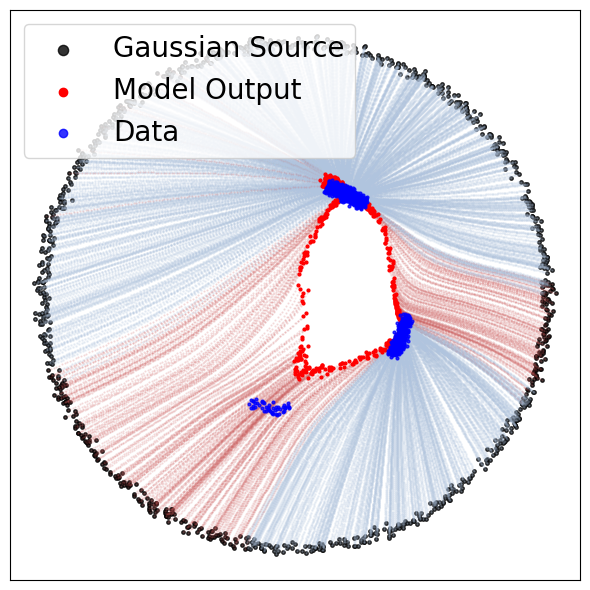

 50%|████▉     | 9951/20000 [00:25<00:20, 497.58it/s]

10000: loss 92.621 time 16.79


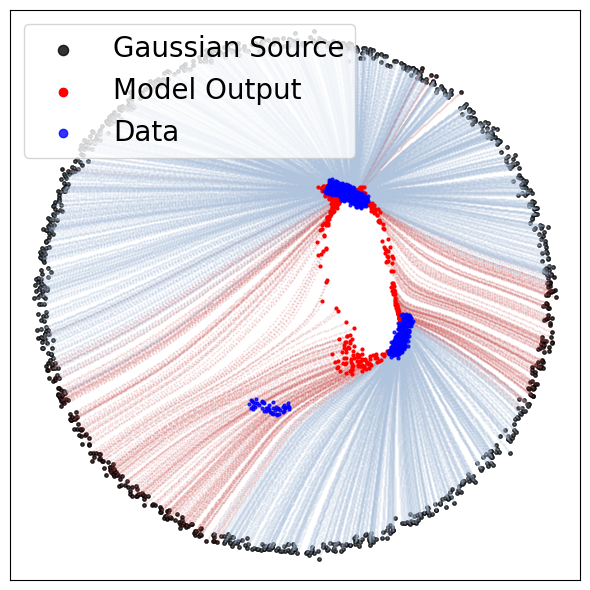

 75%|███████▍  | 14998/20000 [00:42<00:08, 584.88it/s]

15000: loss 174.830 time 16.86


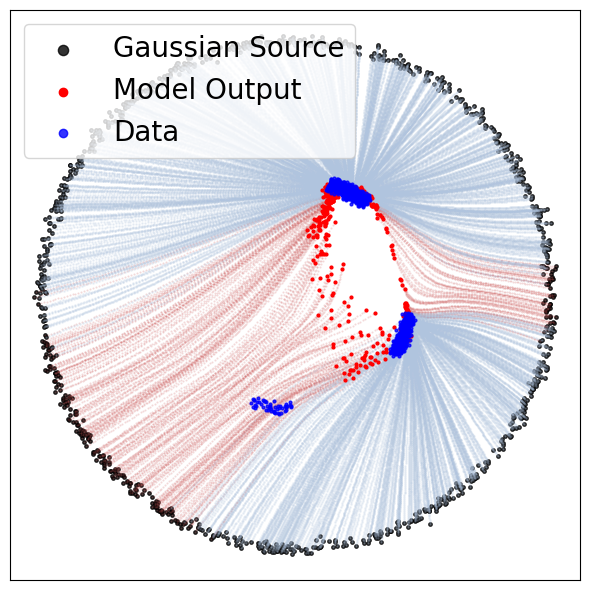

100%|█████████▉| 19952/20000 [00:59<00:00, 516.81it/s]

20000: loss 106.052 time 16.60


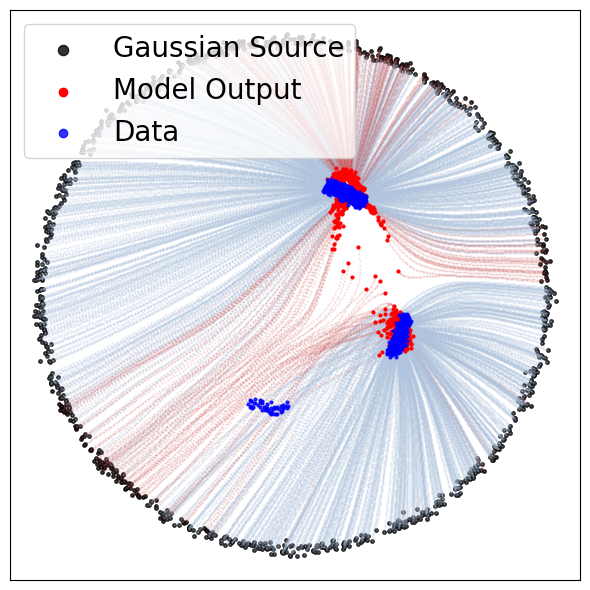

100%|██████████| 20000/20000 [01:06<00:00, 302.63it/s]


In [ ]:
FM = ExactOptimalTransportConditionalFlowMatcher(sigma=sigma)
start = time.time()
for k in tqdm(range(20000)):
    optimizer.zero_grad()

    # Sample batch indices from fixed_x1
    indices = torch.randperm(total_samples)[:batch_size]
    x0 = sample_circle(batch_size).to(device)
    x1 = fixed_x1[indices].to(device)

    t, xt, ut = FM.sample_location_and_conditional_flow(x0, x1)
    t = t.to(device)
    xt = xt.to(device)
    ut = ut.to(device)

    vt = model(torch.cat([xt, t[:, None]], dim=-1))
    loss = torch.mean((vt - ut) ** 2)

    loss.backward()
    optimizer.step()

    if (k + 1) % 5000 == 0:
        end = time.time()
        print(f"{k+1}: loss {loss.item():0.3f} time {(end - start):0.2f}")
        start = end
        node = NeuralODE(
            torch_wrapper(model), solver="dopri5", sensitivity="adjoint", atol=1e-4, rtol=1e-4
        )
        
        with torch.no_grad():
            traj = node.trajectory(
                sample_circle(1024).to(device),
                t_span=torch.linspace(0, 1, 100).to(device),
            )
            plot_trajectories(traj.cpu().numpy(), fixed_x1.cpu().numpy())

        # gen1 = traj[-1, :].cpu().numpy()
        # w2_dist = wasserstein_distance(gen1, fixed_x1.cpu().numpy())
        # print(f"Wasserstein distance: {w2_dist:.4f}")

        # with torch.no_grad():
        #     traj = node.trajectory(
        #         sample_circle_rejection(1024, pca, rejection_threshold=0.97).to(device),
        #         t_span=torch.linspace(0, 1, 100).to(device),
        #     )
        #     plot_trajectories(traj.cpu().numpy(), fixed_x1.cpu().numpy(), title="Rejection Sampling Trajectory", pca=pca)
        # gen2 = traj[-1, :].cpu().numpy()
        # w2_dist = wasserstein_distance(gen2, fixed_x1.cpu().numpy())
        # print(f"Wasserstein distance (Rejection Sampling): {w2_dist:.4f}")

## Figure 2.

### (a) OT-CFM with Approximated Source (iter 200)

In [ ]:
# save base_model
# torch.save(base_model.state_dict(), "viz_models/base_model_200iter.pth")
base_model = MLP(dim=dim, time_varying=True).to(device)

# load base_model
base_model.load_state_dict(torch.load("ckpts/base_model_200iter.pth"))

<All keys matched successfully>

In [ ]:
# Pre-initialize the NeuralODE to avoid recreating it in every iteration
static_node = NeuralODE(
    torch_wrapper(base_model), solver="dopri5", sensitivity="adjoint", atol=1e-4, rtol=1e-4
)

with torch.no_grad():
    samples = static_node.trajectory(
            sample_circle(20000).to(device),
            t_span=torch.linspace(0, 1, 100).to(device),
        )

samples = samples[-1, :].to(device)
# normalize samples to mean 0
samples = samples - torch.mean(samples, dim=0, keepdim=True)
# samples = samples / torch.mean(torch.norm(samples, dim=-1, keepdim=True)) * 55.4185

In [ ]:
model = MLP(dim=dim, time_varying=True).to(device)
optimizer = torch.optim.Adam(model.parameters())

  0%|          | 0/20000 [00:00<?, ?it/s]

 25%|██▍       | 4955/20000 [00:06<00:19, 760.46it/s]

5000: loss 401.159 time 6.61


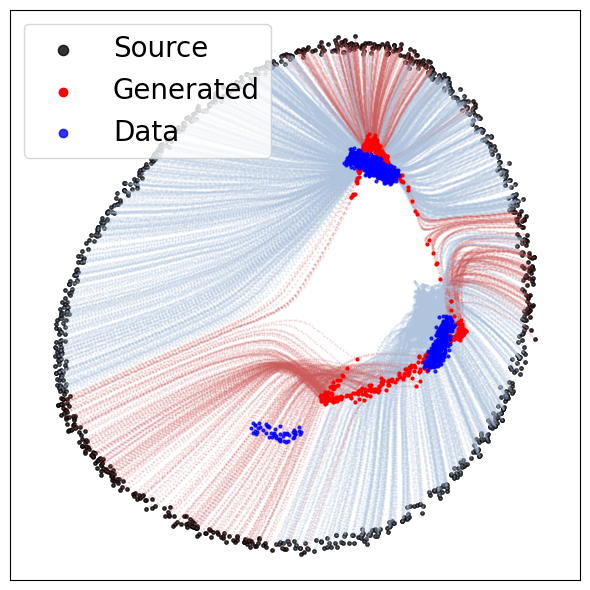

 26%|██▌       | 5102/20000 [00:14<05:32, 44.75it/s] 

Metrics:
AMD: 1.8449
Percentage of bad samples (MD > eps): 36.13%
Wasserstein distance: 10.8466
Coverage: 0.4111
MMD score: 0.090754


 50%|████▉     | 9951/20000 [00:20<00:12, 778.39it/s]

10000: loss 240.128 time 14.34


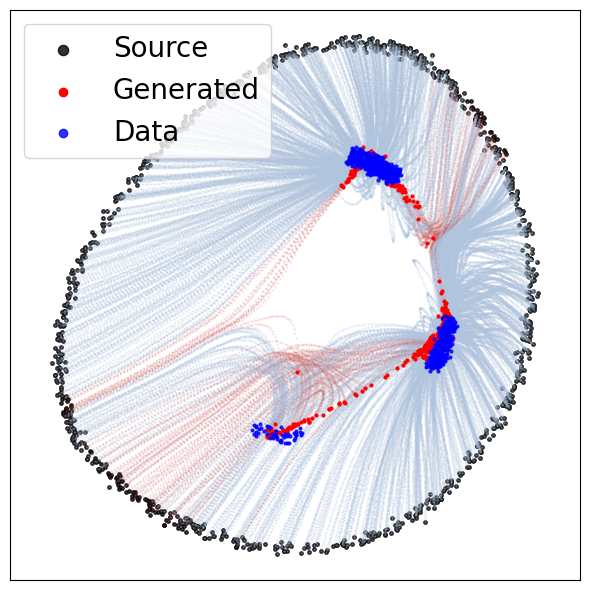

 50%|█████     | 10099/20000 [00:28<03:48, 43.27it/s]

Metrics:
AMD: 0.5464
Percentage of bad samples (MD > eps): 11.72%
Wasserstein distance: 12.7403
Coverage: 0.6279
MMD score: 0.055141


 75%|███████▍  | 14995/20000 [00:35<00:06, 801.59it/s]

15000: loss 351.379 time 14.36


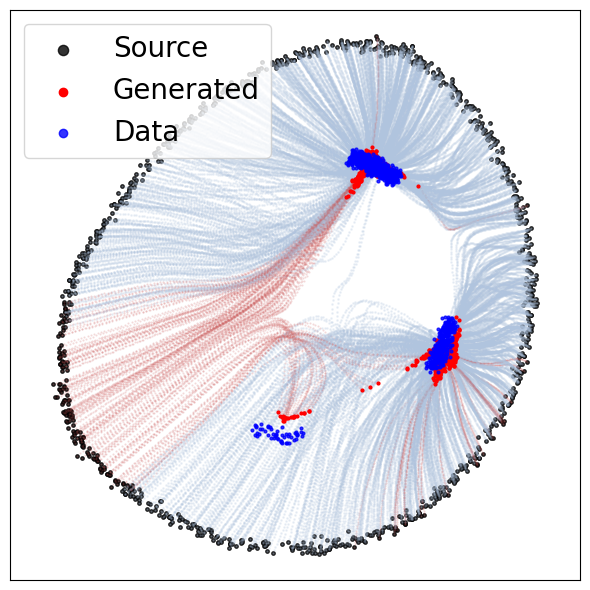

 75%|███████▌  | 15076/20000 [00:42<02:20, 35.10it/s] 

Metrics:
AMD: 0.5176
Percentage of bad samples (MD > eps): 15.62%
Wasserstein distance: 9.9968
Coverage: 0.5723
MMD score: 0.058549


100%|█████████▉| 19994/20000 [00:49<00:00, 721.17it/s]

20000: loss 276.583 time 14.24


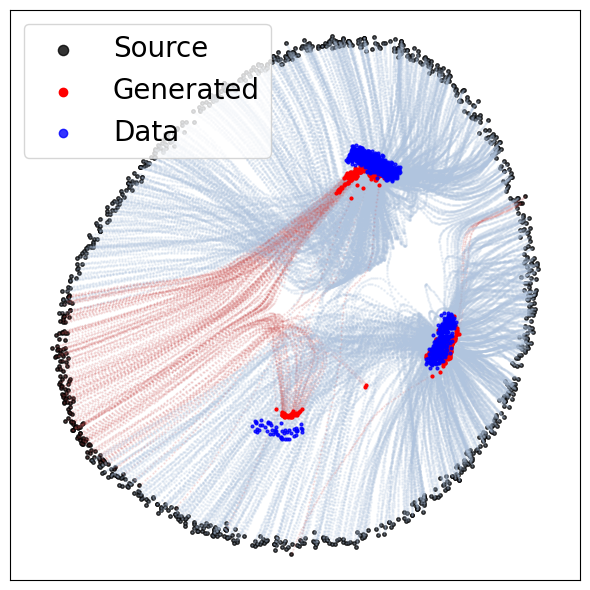

100%|██████████| 20000/20000 [00:57<00:00, 349.23it/s]

Metrics:
AMD: 0.4908
Percentage of bad samples (MD > eps): 14.45%
Wasserstein distance: 10.7572
Coverage: 0.4541
MMD score: 0.114659


In [ ]:
FM = ConditionalFlowMatcher(sigma=sigma)
start = time.time()

# Pre-initialize the NeuralODE to avoid recreating it in every iteration
static_node = NeuralODE(
    torch_wrapper(base_model), solver="dopri5", sensitivity="adjoint", atol=1e-4, rtol=1e-4
)

for k in tqdm(range(20000)):
    optimizer.zero_grad()

    # Sample batch indices from fixed_x1
    indices = torch.randperm(total_samples)[:batch_size]
    
    # random sample from traj to use as x0 from 20000 samples
    random_indices = torch.randint(0, samples.shape[0], (batch_size,))
    x0 = samples[random_indices].to(device)
    
    x1 = fixed_x1[indices].to(device)

    # Move these operations outside the device assignment for better efficiency
    t, xt, ut = FM.sample_location_and_conditional_flow(x0, x1)
    
    # Use torch.cat once instead of creating intermediate tensors
    vt = model(torch.cat([xt, t[:, None]], dim=-1))
    loss = torch.mean((vt - ut) ** 2)

    loss.backward()
    optimizer.step()

    if (k + 1) % 5000 == 0:
        end = time.time()
        print(f"{k+1}: loss {loss.item():0.3f} time {(end - start):0.2f}")
        start = end
        
        # Visualize results
        with torch.no_grad():
            # Generate trajectories for visualization
            rand_indices = torch.randint(0, samples.shape[0], (1024,))
            noise = samples[rand_indices]

            # Create visualization node
            vis_node = NeuralODE(
                torch_wrapper(model), solver="dopri5", sensitivity="adjoint", atol=1e-4, rtol=1e-4
            )
            
            traj = vis_node.trajectory(
                noise,
                t_span=torch.linspace(0, 1, 100).to(device),
            )
            metrics = plot_trajectories(traj.cpu().numpy(), fixed_x1.cpu().numpy())

            print("Metrics:")
            print(f"AMD: {metrics[0]:.4f}")
            print(f"Percentage of bad samples (MD > eps): {metrics[1]:.2f}%")
            print(f"Wasserstein distance: {metrics[2]:.4f}")
            print(f"Coverage: {metrics[3]:.4f}")
            # print(f"Precision: {metrics[4]:.4f}")
            print(f"MMD score: {metrics[5]:.6f}")

### (b)(c) OT-CFM with Approximated Source (iter 8500)
Run with other checkpoints to see more resutls at ckpts/

In [ ]:
base_model = MLP(dim=dim, time_varying=True).to(device)
base_model.load_state_dict(torch.load('viz_models/base_model_8500iter.pth'))  # Copy initial weights

static_node = NeuralODE(
    torch_wrapper(base_model), solver="dopri5", sensitivity="adjoint", atol=1e-4, rtol=1e-4
)   
with torch.no_grad():
    samples = static_node.trajectory(
            sample_circle(20000).to(device),
            t_span=torch.linspace(0, 1, 100).to(device),
    )
samples = samples[-1, :].to(device)
samples = samples / torch.mean(torch.norm(samples, dim=-1, keepdim=True)) * 55.4185

Run for CFM-Iter8500


 10%|▉         | 9985/100000 [00:17<02:43, 551.72it/s]

10000: loss 31.271 time 850.37


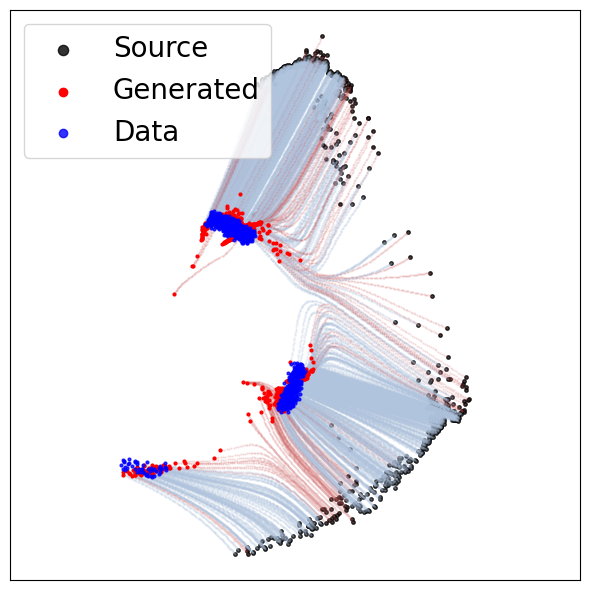

 10%|█         | 10098/100000 [00:25<45:39, 32.82it/s]  

Metrics:
AMD: 0.5751
Percentage of bad samples (MD > eps): 12.79%
Wasserstein distance: 5.6209
Coverage: 0.6357
MMD score: 0.037526
Normalized Wasserstein: 1.881255


 20%|█▉        | 19990/100000 [00:41<02:09, 616.58it/s]

20000: loss 180.581 time 24.57


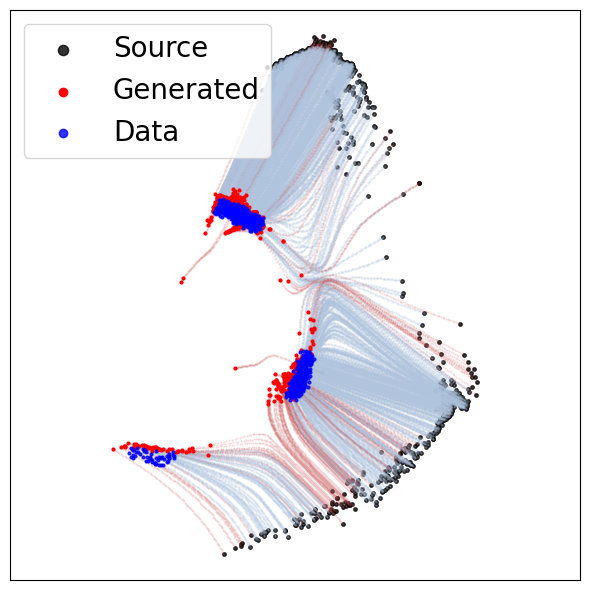

 20%|██        | 20104/100000 [00:49<37:16, 35.72it/s] 

Metrics:
AMD: 0.6017
Percentage of bad samples (MD > eps): 13.77%
Wasserstein distance: 3.2984
Coverage: 0.5117
MMD score: 0.058893
Normalized Wasserstein: 2.199956


 30%|██▉       | 29992/100000 [01:05<01:57, 595.50it/s]

30000: loss 131.441 time 23.99


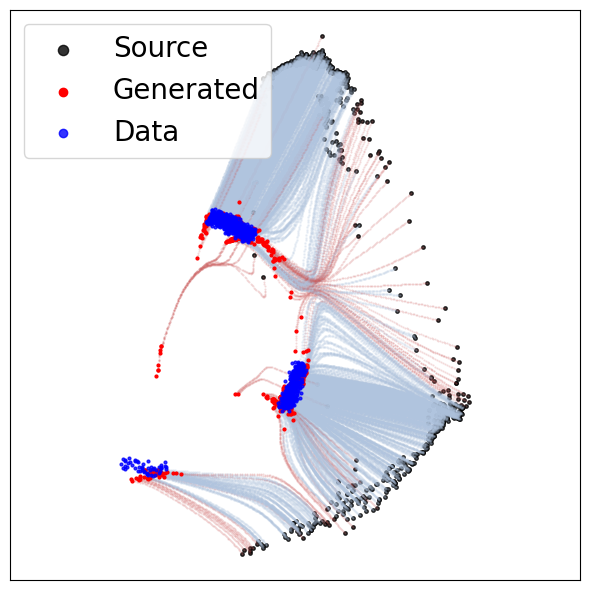

 30%|███       | 30052/100000 [01:14<47:21, 24.61it/s] 

Metrics:
AMD: 0.5833
Percentage of bad samples (MD > eps): 9.47%
Wasserstein distance: 4.4143
Coverage: 0.7666
MMD score: 0.028865
Normalized Wasserstein: 2.356953


 40%|███▉      | 39977/100000 [01:30<01:37, 615.76it/s]

40000: loss 53.743 time 24.55


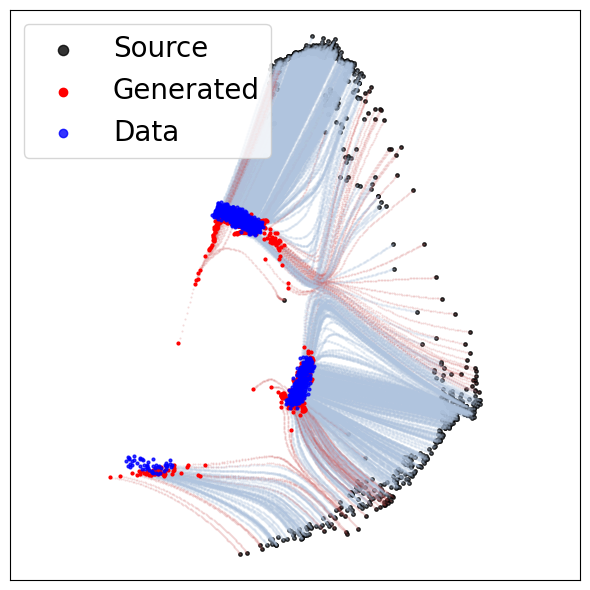

 40%|████      | 40095/100000 [01:38<27:43, 36.01it/s] 

Metrics:
AMD: 0.5697
Percentage of bad samples (MD > eps): 11.33%
Wasserstein distance: 4.5854
Coverage: 0.6738
MMD score: 0.027677
Normalized Wasserstein: 2.101807


 50%|████▉     | 49996/100000 [01:54<01:22, 607.93it/s]

50000: loss 53.473 time 24.30


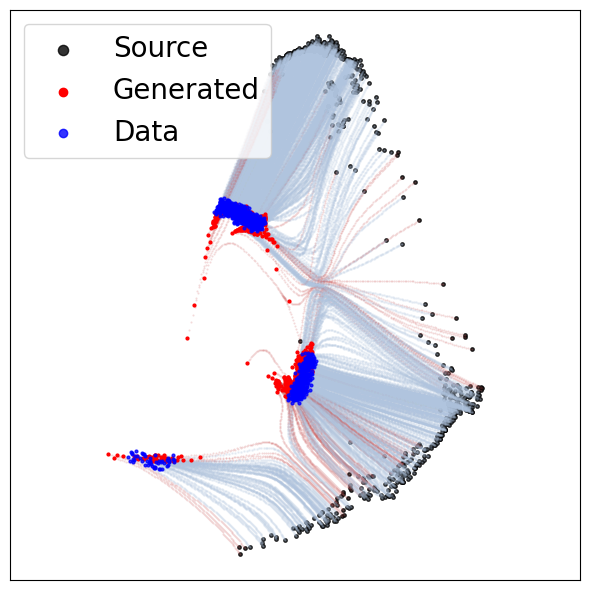

 50%|█████     | 50057/100000 [02:02<33:57, 24.52it/s] 

Metrics:
AMD: 0.4635
Percentage of bad samples (MD > eps): 10.25%
Wasserstein distance: 2.1759
Coverage: 0.7295
MMD score: 0.009936
Normalized Wasserstein: 1.754391


 60%|█████▉    | 59977/100000 [02:20<01:12, 555.05it/s]

60000: loss 65.441 time 25.70


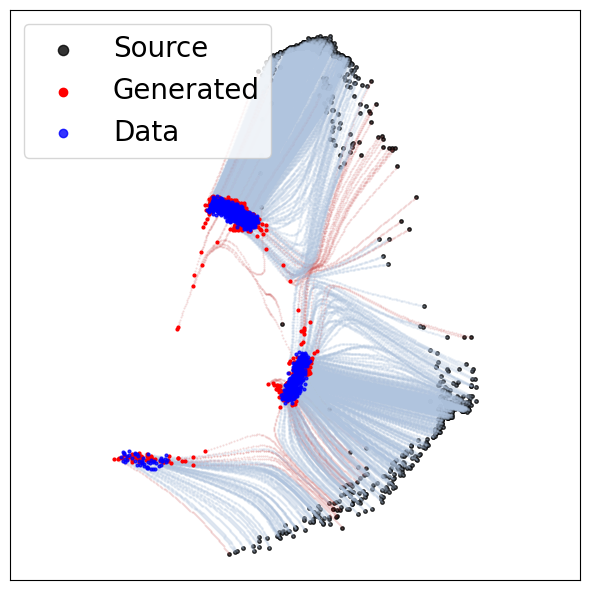

 60%|██████    | 60096/100000 [02:28<19:31, 34.05it/s] 

Metrics:
AMD: 0.4096
Percentage of bad samples (MD > eps): 5.47%
Wasserstein distance: 6.6382
Coverage: 0.7383
MMD score: 0.018102
Normalized Wasserstein: 1.750540


 70%|██████▉   | 69943/100000 [02:44<00:48, 616.37it/s]

70000: loss 183.460 time 24.54


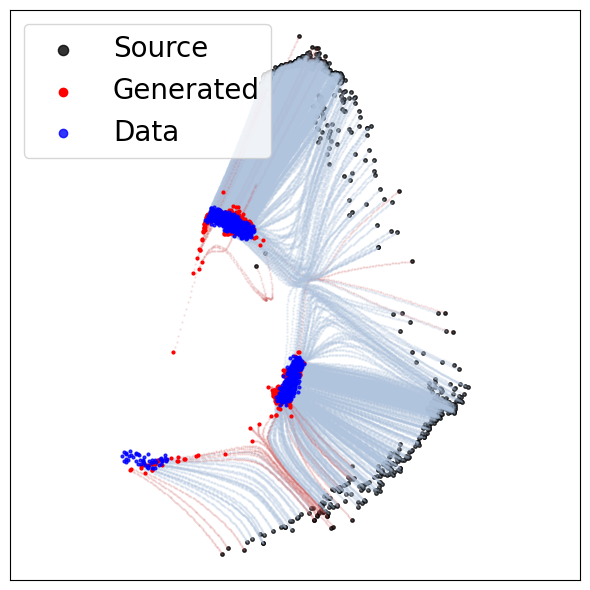

 70%|███████   | 70061/100000 [02:53<14:53, 33.49it/s] 

Metrics:
AMD: 0.3474
Percentage of bad samples (MD > eps): 5.18%
Wasserstein distance: 4.1128
Coverage: 0.7422
MMD score: 0.042713
Normalized Wasserstein: 1.590091


 80%|███████▉  | 79951/100000 [03:10<00:32, 619.98it/s]

80000: loss 8.508 time 25.86


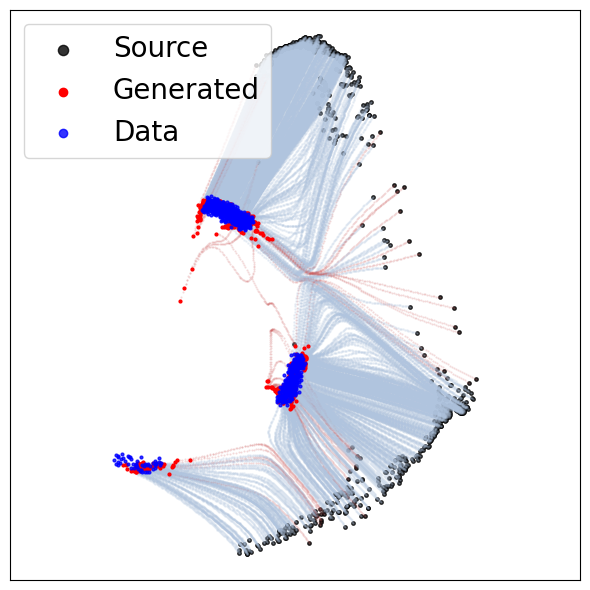

 80%|████████  | 80069/100000 [03:18<09:31, 34.89it/s] 

Metrics:
AMD: 0.3122
Percentage of bad samples (MD > eps): 4.79%
Wasserstein distance: 5.3602
Coverage: 0.8457
MMD score: 0.021179
Normalized Wasserstein: 1.338653


 90%|████████▉ | 89943/100000 [03:36<00:16, 619.91it/s]

90000: loss 110.463 time 25.36


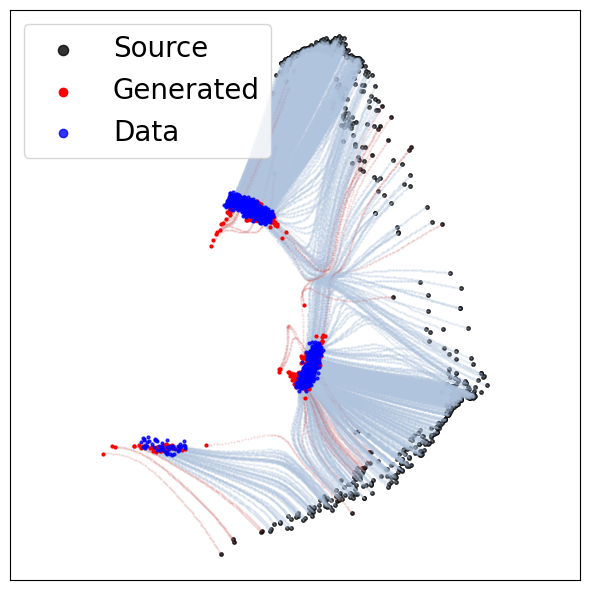

 90%|█████████ | 90061/100000 [03:44<04:57, 33.39it/s] 

Metrics:
AMD: 0.2681
Percentage of bad samples (MD > eps): 4.39%
Wasserstein distance: 5.9958
Coverage: 0.8154
MMD score: 0.029597
Normalized Wasserstein: 1.056289


100%|█████████▉| 99991/100000 [04:01<00:00, 536.15it/s]

100000: loss 220.616 time 25.61


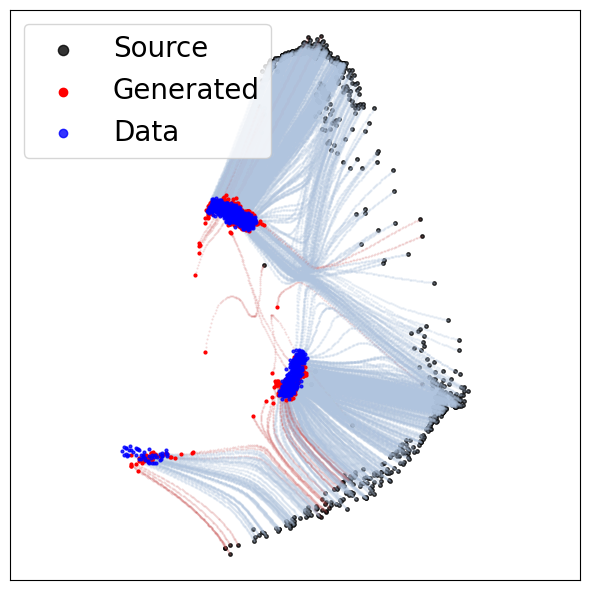

100%|██████████| 100000/100000 [04:09<00:00, 400.51it/s]

Metrics:
AMD: 0.2833
Percentage of bad samples (MD > eps): 4.10%
Wasserstein distance: 3.8199
Coverage: 0.7646
MMD score: 0.018819
Normalized Wasserstein: 1.348804


In [ ]:
print(f"Run for CFM-Iter8500")
model = MLP(dim=dim, time_varying=True).to(device)
optimizer = torch.optim.Adam(model.parameters())

FM = ExactOptimalTransportConditionalFlowMatcher(sigma=sigma)

for k in tqdm(range(100000)):
    optimizer.zero_grad()

    # Sample batch indices from fixed_x1
    indices = torch.randperm(total_samples)[:batch_size]
    
    # random sample from traj to use as x0 from 20000 samples
    random_indices = torch.randint(0, samples.shape[0], (batch_size,))
    x0 = samples[random_indices].to(device)
    
    x1 = fixed_x1[indices].to(device)

    # Move these operations outside the device assignment for better efficiency
    t, xt, ut = FM.sample_location_and_conditional_flow(x0, x1)
    
    # Use torch.cat once instead of creating intermediate tensors
    vt = model(torch.cat([xt, t[:, None]], dim=-1))
    loss = torch.mean((vt - ut) ** 2)

    loss.backward()
    optimizer.step()

    if (k + 1) % 10000 == 0:
        end = time.time()
        print(f"{k+1}: loss {loss.item():0.3f} time {(end - start):0.2f}")
        start = end
        
        # Visualize results
        with torch.no_grad():
            # Generate trajectories for visualization
            rand_indices = torch.randint(0, samples.shape[0], (1024,))
            noise = samples[rand_indices]

            # Create visualization node
            vis_node = NeuralODE(
                torch_wrapper(model), solver="dopri5", sensitivity="adjoint", atol=1e-4, rtol=1e-4
            )
            
            traj = vis_node.trajectory(
                noise,
                t_span=torch.linspace(0, 1, 100).to(device),
            )
            metrics = plot_trajectories(traj.cpu().numpy(), fixed_x1.cpu().numpy(), title="CMF-Iter7000", k=f"{(k+1)//1000}k", base_angles=base_angles, run_idx=0)
            # torch.save(model.state_dict(), f"viz_models/FM_iter20_{k+1}.pth")
            print("Metrics:")
            print(f"AMD: {metrics[0]:.4f}")
            print(f"Percentage of bad samples (MD > eps): {metrics[1]:.2f}%")
            print(f"Wasserstein distance: {metrics[2]:.4f}")
            print(f"Coverage: {metrics[3]:.4f}")
            # print(f"Precision: {metrics[4]:.4f}")
            print(f"MMD score: {metrics[5]:.6f}")
            print(f"Normalized Wasserstein: {metrics[6]:.6f}")


## Figure. 3

In [ ]:
def sample_noise_directions(base_angles, num_samples=200, direction_ratios=[0.05, 0.3, 0.65], angle_offset_deg=10.0):
    assert abs(sum(direction_ratios) - 1.0) < 1e-6, "direction_ratios must sum to 1.0"
    num_directions = len(direction_ratios)
    df = 3027
    chi2 = Chi2(df)
    counts = [int(round(r * num_samples)) for r in direction_ratios]
    diff = num_samples - sum(counts)
    if diff != 0:
        max_idx = torch.tensor(direction_ratios).argmax().item()
        counts[max_idx] += diff
    angle_offset = torch.deg2rad(torch.tensor(angle_offset_deg))
    all_points = []
    for base_angle, count in zip(base_angles, counts):
        if count == 0:
            continue
        # Add small random perturbation to the angles
        angles = base_angle + torch.linspace(-angle_offset, angle_offset, count)
        random_perturbation = torch.randn(count) * (angle_offset * 0.1)  # 10% of offset as random noise
        angles = angles + random_perturbation
        radius = torch.sqrt(chi2.sample((count,)))
        x = radius * torch.cos(angles)
        y = radius * torch.sin(angles)
        points = torch.stack([x, y], dim=1)
        all_points.append(points)
    return torch.cat(all_points, dim=0)

In [ ]:
direction_ratios = [0.05, 0.3, 0.65]

def angle_to_vector(angle):
    return torch.stack([torch.cos(angle), torch.sin(angle)], dim=-1)

def sample_circle_rejection_dir_ratio(base_angles, direction_ratios, num_samples=200, rejection_threshold=0.9, batch_size=128):
    base_angles_tensor = torch.tensor(base_angles)
    base_vectors = angle_to_vector(base_angles_tensor)  # shape: [3, 2]

    # Determine sample counts per direction
    sample_counts = [int(r * num_samples) for r in direction_ratios]

    # Adjust in case rounding drops samples
    remainder = num_samples - sum(sample_counts)
    for i in range(remainder):
        sample_counts[i % len(sample_counts)] += 1

    accepted_all = []

    for i in range(len(base_vectors)):
        base_vec = base_vectors[i]  # shape: [2]
        count_needed = sample_counts[i]
        accepted = []

        while len(accepted) < count_needed:
            batch_points = sample_circle(batch_size)  # [B, 2]
            directions = batch_points / batch_points.norm(dim=1, keepdim=True)  # [B, 2]

            # Cosine similarity with base_vec
            cos_sim = torch.matmul(directions, base_vec)  # [B]

            # Accept points with high similarity
            mask = cos_sim >= rejection_threshold
            accepted_batch = batch_points[mask]

            accepted.append(accepted_batch)

        accepted_dir = torch.cat(accepted, dim=0)[:count_needed]
        accepted_all.append(accepted_dir)

    return torch.cat(accepted_all, dim=0)



### (a) OT-CFM with direcional source

In [ ]:
model = MLP(dim=dim, time_varying=True).to(device)
optimizer = torch.optim.Adam(model.parameters())

  0%|          | 0/100000 [00:00<?, ?it/s]/tmp/ipykernel_4154769/2815222909.py:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  base_angles_tensor = torch.tensor(base_angles)
 10%|▉         | 9986/100000 [01:14<11:04, 135.49it/s]

10000: loss 97.917 time 75.04


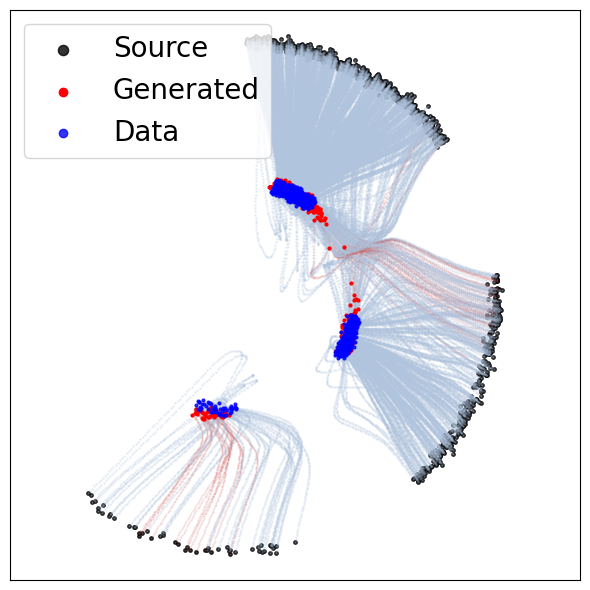

 10%|█         | 10012/100000 [01:23<3:20:10,  7.49it/s]

Metrics:
AMD: 0.2634
Percentage of bad samples (MD > eps): 4.88%
Wasserstein distance: 5.0541
Coverage: 0.8105
MMD score: 0.020154


 20%|█▉        | 19991/100000 [02:37<09:49, 135.68it/s] 

20000: loss 170.798 time 82.12


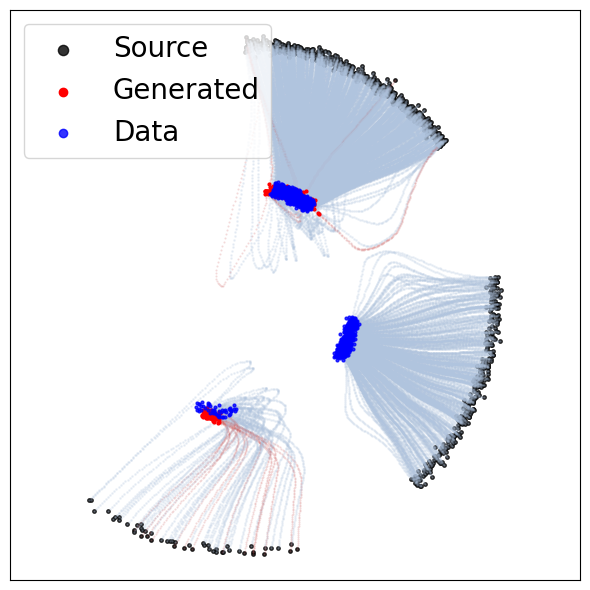

 20%|██        | 20019/100000 [02:45<2:58:36,  7.46it/s]

Metrics:
AMD: 0.1547
Percentage of bad samples (MD > eps): 2.25%
Wasserstein distance: 1.8707
Coverage: 0.7686
MMD score: 0.027114


 30%|██▉       | 29987/100000 [04:00<08:33, 136.26it/s] 

30000: loss 105.682 time 82.95


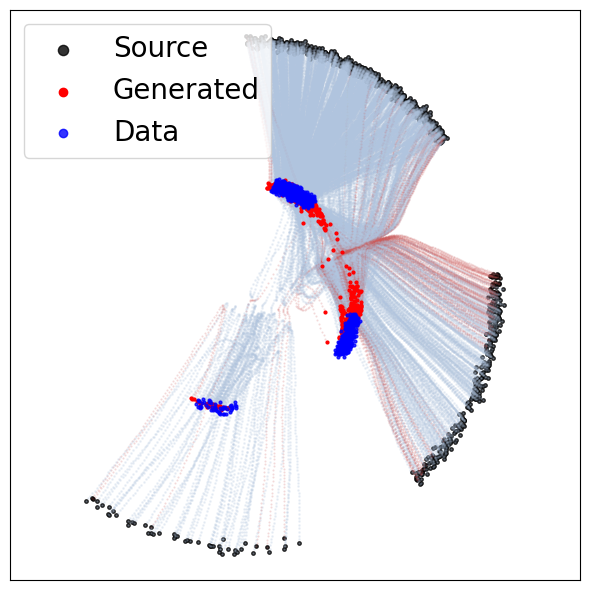

 30%|███       | 30015/100000 [04:08<2:30:00,  7.78it/s]

Metrics:
AMD: 0.6136
Percentage of bad samples (MD > eps): 14.26%
Wasserstein distance: 4.5596
Coverage: 0.7207
MMD score: 0.026302


 40%|███▉      | 39992/100000 [05:23<07:21, 135.79it/s] 

40000: loss 124.395 time 83.03


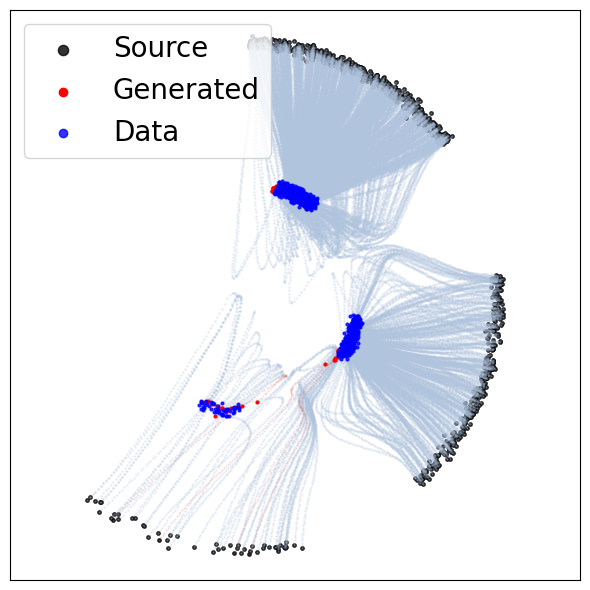

 40%|████      | 40019/100000 [05:30<2:05:20,  7.98it/s]

Metrics:
AMD: 0.1158
Percentage of bad samples (MD > eps): 0.39%
Wasserstein distance: 5.6584
Coverage: 0.6807
MMD score: 0.068139


 50%|████▉     | 49990/100000 [06:44<06:08, 135.88it/s] 

50000: loss 77.034 time 81.71


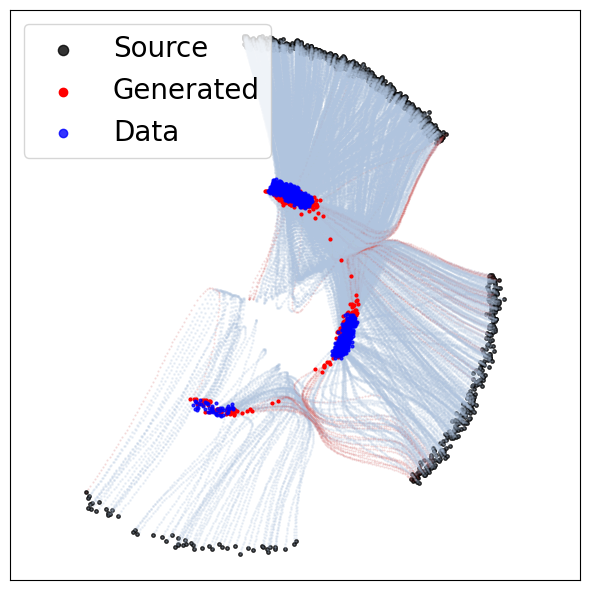

 50%|█████     | 50017/100000 [06:53<1:52:42,  7.39it/s]

Metrics:
AMD: 0.2930
Percentage of bad samples (MD > eps): 4.69%
Wasserstein distance: 4.9423
Coverage: 0.7959
MMD score: 0.022114


 60%|█████▉    | 59987/100000 [08:07<04:53, 136.46it/s] 

60000: loss 43.440 time 82.35


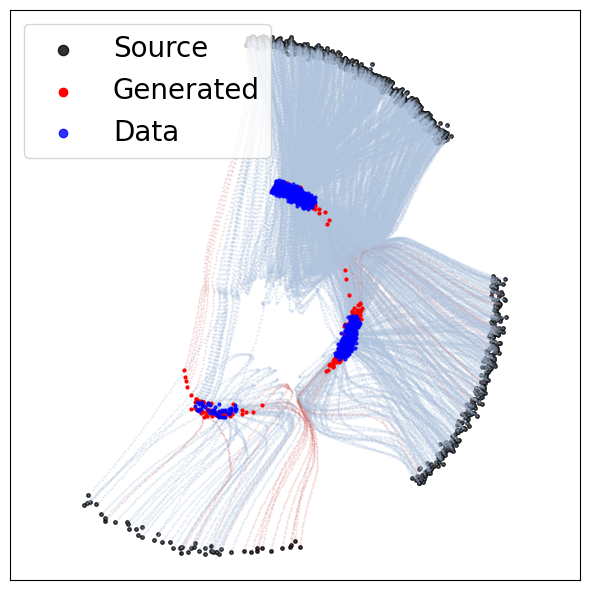

 60%|██████    | 60014/100000 [08:15<1:28:18,  7.55it/s]

Metrics:
AMD: 0.2467
Percentage of bad samples (MD > eps): 4.10%
Wasserstein distance: 8.1722
Coverage: 0.7734
MMD score: 0.016758


 70%|██████▉   | 69991/100000 [09:29<03:57, 126.12it/s] 

70000: loss 107.009 time 81.94


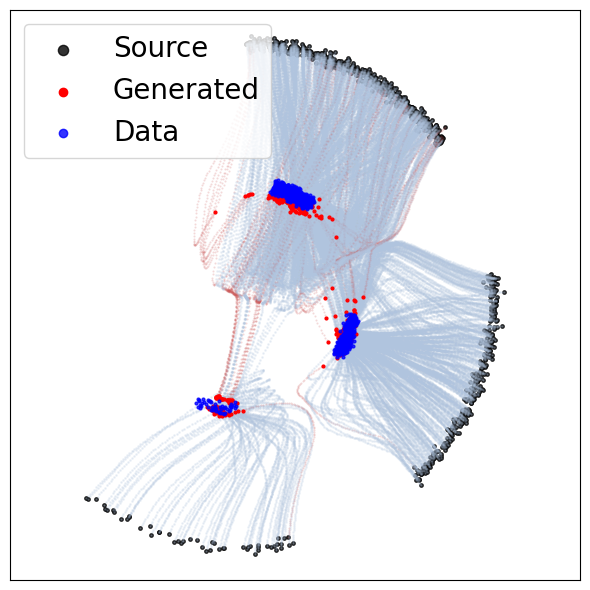

 70%|███████   | 70018/100000 [09:37<1:05:29,  7.63it/s]

Metrics:
AMD: 0.3383
Percentage of bad samples (MD > eps): 6.25%
Wasserstein distance: 10.6519
Coverage: 0.6680
MMD score: 0.047570


 80%|███████▉  | 79997/100000 [10:52<02:26, 136.73it/s] 

80000: loss 124.782 time 83.26


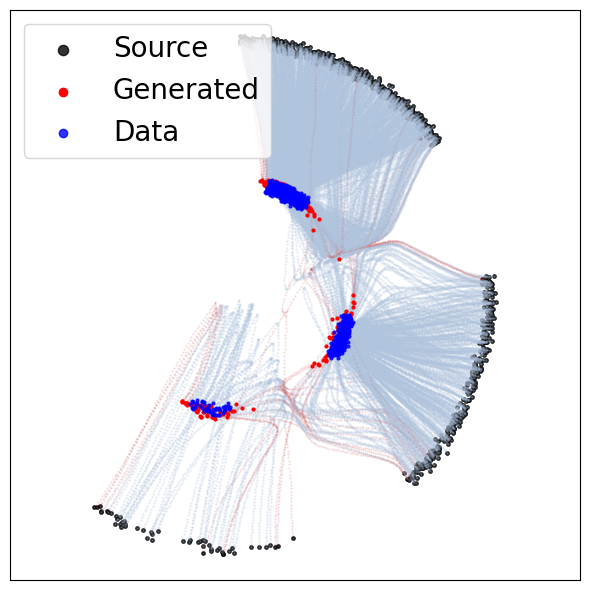

 80%|████████  | 80024/100000 [11:00<42:25,  7.85it/s] 

Metrics:
AMD: 0.2308
Percentage of bad samples (MD > eps): 4.20%
Wasserstein distance: 4.5219
Coverage: 0.8154
MMD score: 0.019491


 90%|████████▉ | 89998/100000 [12:14<01:13, 135.58it/s]

90000: loss 286.122 time 82.42


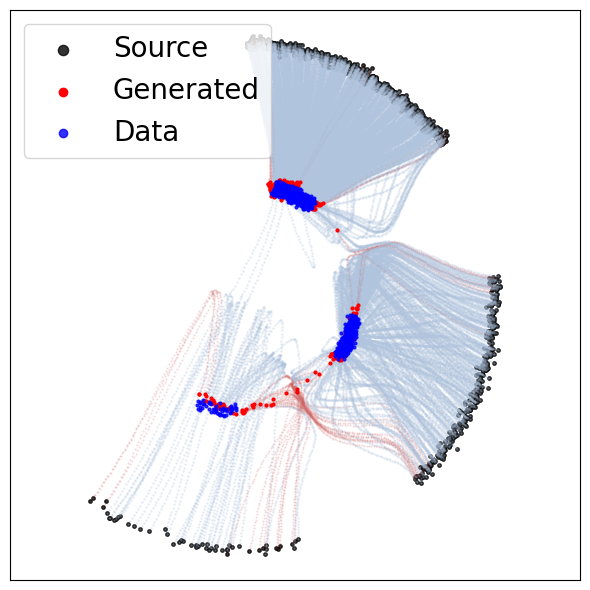

 90%|█████████ | 90026/100000 [12:23<21:19,  7.80it/s] 

Metrics:
AMD: 0.2906
Percentage of bad samples (MD > eps): 4.10%
Wasserstein distance: 3.0667
Coverage: 0.8164
MMD score: 0.013686


100%|█████████▉| 99989/100000 [13:37<00:00, 135.07it/s]

100000: loss 115.321 time 82.31


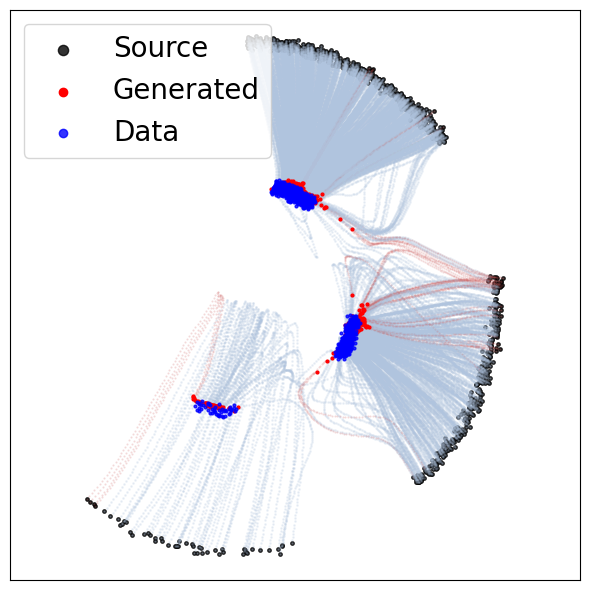

100%|██████████| 100000/100000 [13:45<00:00, 121.12it/s]

Metrics:
AMD: 0.2332
Percentage of bad samples (MD > eps): 3.61%
Wasserstein distance: 3.0971
Coverage: 0.7920
MMD score: 0.023175


In [ ]:
FM = ConditionalFlowMatcher(sigma=sigma)
start = time.time()
for k in tqdm(range(100000)):
    optimizer.zero_grad()

    # Sample batch indices from fixed_x1
    indices = torch.randperm(total_samples)[:batch_size]
    # x0 = sample_circle(batch_size).to(device)
    # x0 = sample_circle_rejection(batch_size, pca, rejection_threshold=0.98).to(device)
    x0 = sample_circle_rejection_dir_ratio(base_angles, direction_ratios, batch_size, rejection_threshold=0.9).to(device)
    x1 = fixed_x1[indices].to(device)

    t, xt, ut = FM.sample_location_and_conditional_flow(x0, x1)
    t = t.to(device)
    xt = xt.to(device)
    ut = ut.to(device)

    vt = model(torch.cat([xt, t[:, None]], dim=-1))
    loss = torch.mean((vt - ut) ** 2)

    loss.backward()
    optimizer.step()

    if (k + 1) % 10000 == 0:
        end = time.time()
        print(f"{k+1}: loss {loss.item():0.3f} time {(end - start):0.2f}")
        start = end
        node = NeuralODE(
            torch_wrapper(model), solver="dopri5", sensitivity="adjoint", atol=1e-4, rtol=1e-4
        )
        
        with torch.no_grad():
            traj = node.trajectory(
                # sample_circle(1024).to(device),
                # sample_circle_rejection(1024, pca, rejection_threshold=0.98).to(device),
                sample_circle_rejection_dir_ratio(base_angles, direction_ratios, 1024, rejection_threshold=0.9).to(device),
                t_span=torch.linspace(0, 1, 100).to(device),
            )
        metrics = plot_trajectories(traj.cpu().numpy(), fixed_x1.cpu().numpy())
        print("Metrics:")
        print(f"AMD: {metrics[0]:.4f}")
        print(f"Percentage of bad samples (MD > eps): {metrics[1]:.2f}%")
        print(f"Wasserstein distance: {metrics[2]:.4f}")
        print(f"Coverage: {metrics[3]:.4f}")
        # print(f"Precision: {metrics[4]:.4f}")
        print(f"MMD score: {metrics[5]:.6f}")

## Figure 7.

In [ ]:
def sample_circle_directions(base_angles, num_samples=200, direction_ratios=[0.05, 0.3, 0.65], angle_offset_deg=10.0):
    assert abs(sum(direction_ratios) - 1.0) < 1e-6, "direction_ratios must sum to 1.0"
    num_directions = len(direction_ratios)
    df = 3072
    chi2 = Chi2(df)
    counts = [int(round(r * num_samples)) for r in direction_ratios]
    diff = num_samples - sum(counts)
    if diff != 0:
        max_idx = torch.tensor(direction_ratios).argmax().item()
        counts[max_idx] += diff
    angle_offset = torch.deg2rad(torch.tensor(angle_offset_deg))
    all_points = []
    for base_angle, count in zip(base_angles, counts):
        if count == 0:
            continue
        # Add small random perturbation to the angles
        angles = base_angle + torch.linspace(-angle_offset, angle_offset, count)
        random_perturbation = torch.randn(count) * (angle_offset * 0.1)  # 10% of offset as random noise
        angles = angles + random_perturbation
        radius = torch.sqrt(chi2.sample((count,)))
        x = radius * torch.cos(angles)
        y = radius * torch.sin(angles)
        points = torch.stack([x, y], dim=1)
        all_points.append(points)
    return torch.cat(all_points, dim=0)

sigma = 0
dim = 2
batch_size = 16
total_samples = 1024
torch.manual_seed(124142)

# Pre-generate fixed x1 dataset
base_angles = torch.rand(3) * 2 * torch.pi
fixed_x1 = sample_circle_directions(base_angles, total_samples).to(device)

model = MLP(dim=dim, time_varying=True).to(device)
optimizer = torch.optim.Adam(model.parameters())

 25%|██████████████████████████████████████████████                                                                                                                                            | 4957/20000 [00:11<00:34, 440.67it/s]

5000: loss 39.765 time 11.43


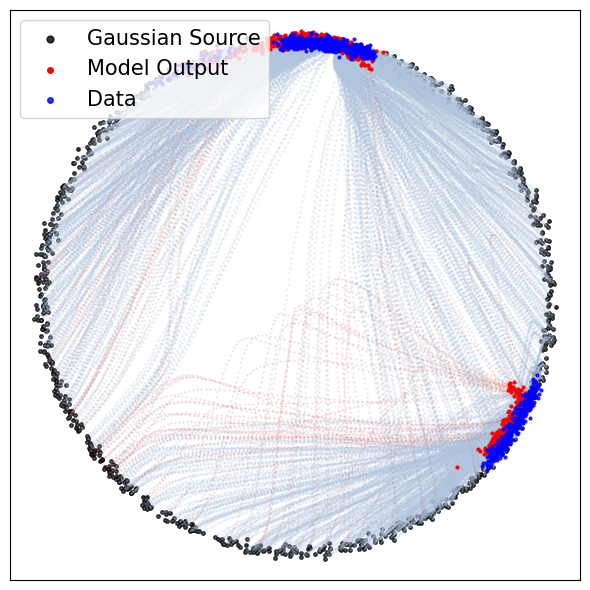

 50%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                             | 9997/20000 [00:38<00:22, 441.16it/s]

10000: loss 29.869 time 27.57


 50%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                             | 9997/20000 [00:50<00:22, 441.16it/s]

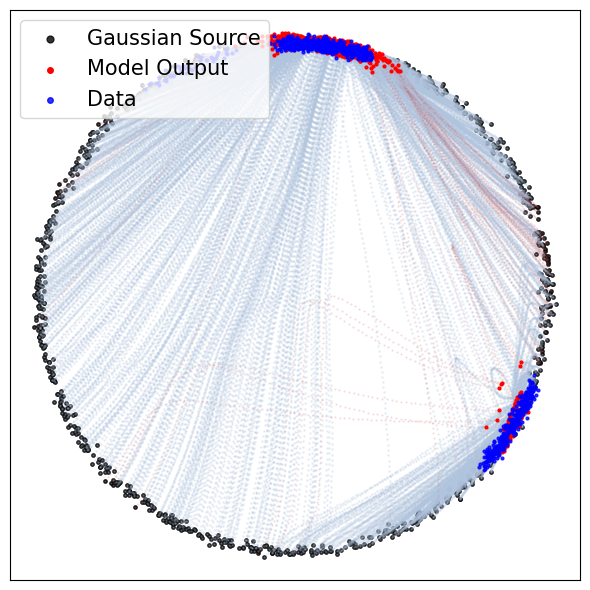

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 14986/20000 [01:07<00:11, 436.64it/s]

15000: loss 170.374 time 28.23


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 14986/20000 [01:20<00:11, 436.64it/s]

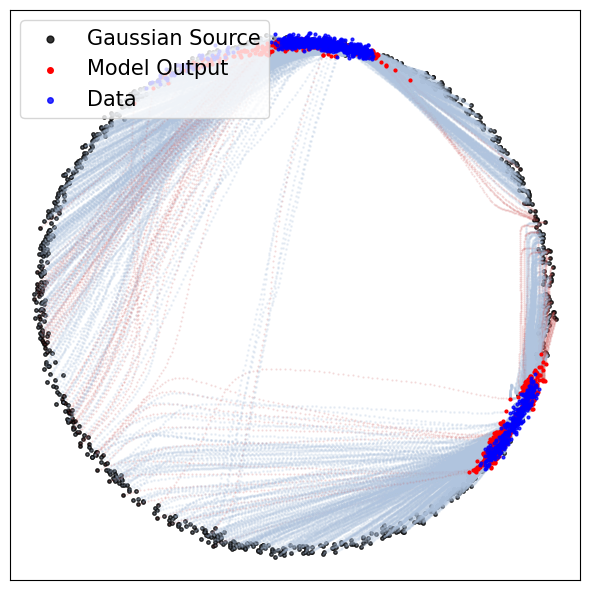

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 19998/20000 [01:34<00:00, 437.48it/s]

20000: loss 51.193 time 27.55


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 19998/20000 [01:50<00:00, 437.48it/s]

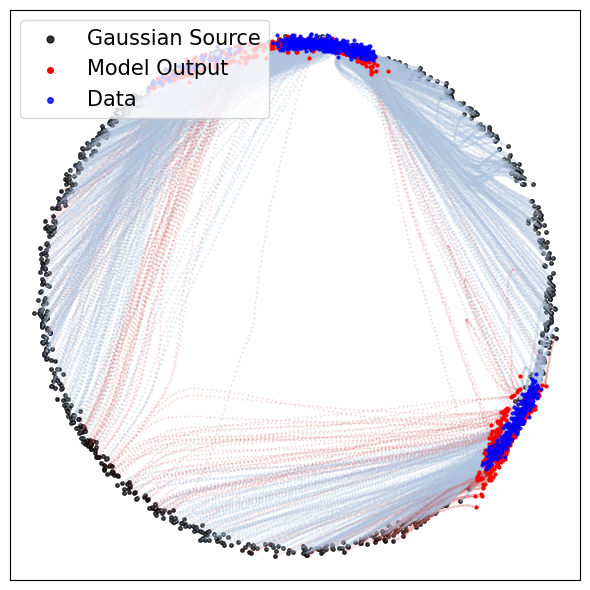

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:51<00:00, 180.07it/s]


In [ ]:
FM = ExactOptimalTransportConditionalFlowMatcher(sigma=sigma)
start = time.time()
for k in tqdm(range(20000)):
    optimizer.zero_grad()

    # Sample batch indices from fixed_x1
    indices = torch.randperm(total_samples)[:batch_size]
    x0 = sample_circle(batch_size).to(device)
    x1 = fixed_x1[indices].to(device)

    t, xt, ut = FM.sample_location_and_conditional_flow(x0, x1)
    t = t.to(device)
    xt = xt.to(device)
    ut = ut.to(device)

    vt = model(torch.cat([xt, t[:, None]], dim=-1))
    loss = torch.mean((vt - ut) ** 2)

    loss.backward()
    optimizer.step()

    if (k + 1) % 5000 == 0:
        end = time.time()
        print(f"{k+1}: loss {loss.item():0.3f} time {(end - start):0.2f}")
        start = end
        node = NeuralODE(
            torch_wrapper(model), solver="dopri5", sensitivity="adjoint", atol=1e-4, rtol=1e-4
        )
        
        with torch.no_grad():
            traj = node.trajectory(
                sample_circle(1024).to(device),
                t_span=torch.linspace(0, 1, 100).to(device),
            )
            plot_trajectories(traj.cpu().numpy(), fixed_x1.cpu().numpy(), save_path="figure/otcfm_alignment.png")

        # gen1 = traj[-1, :].cpu().numpy()
        # w2_dist = wasserstein_distance(gen1, fixed_x1.cpu().numpy())
        # print(f"Wasserstein distance: {w2_dist:.4f}")

        # with torch.no_grad():
        #     traj = node.trajectory(
        #         sample_circle_rejection(1024, pca, rejection_threshold=0.97).to(device),
        #         t_span=torch.linspace(0, 1, 100).to(device),
        #     )
        #     plot_trajectories(traj.cpu().numpy(), fixed_x1.cpu().numpy(), title="Rejection Sampling Trajectory", pca=pca)
        # gen2 = traj[-1, :].cpu().numpy()
        # w2_dist = wasserstein_distance(gen2, fixed_x1.cpu().numpy())
        # print(f"Wasserstein distance (Rejection Sampling): {w2_dist:.4f}")

 25%|██████████████████████████████████████████████                                                                                                                                            | 4957/20000 [00:07<00:24, 619.10it/s]

5000: loss 357.690 time 8.06


 25%|██████████████████████████████████████████████                                                                                                                                            | 4957/20000 [00:19<00:24, 619.10it/s]

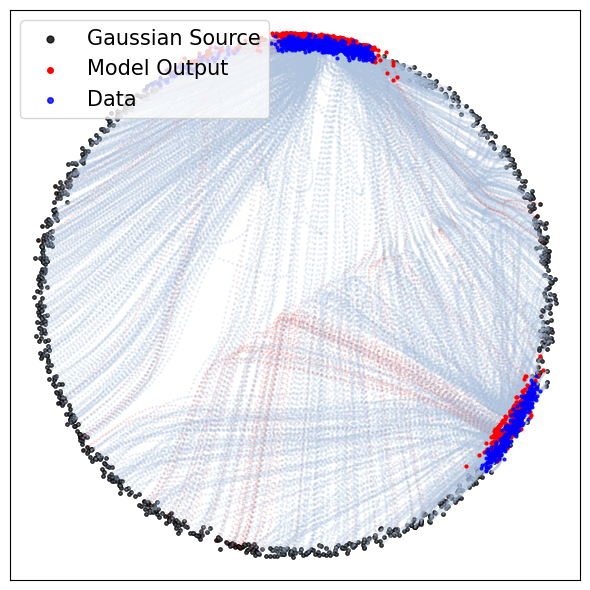

 50%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                             | 9975/20000 [00:32<00:16, 621.96it/s]

10000: loss 122.514 time 24.70


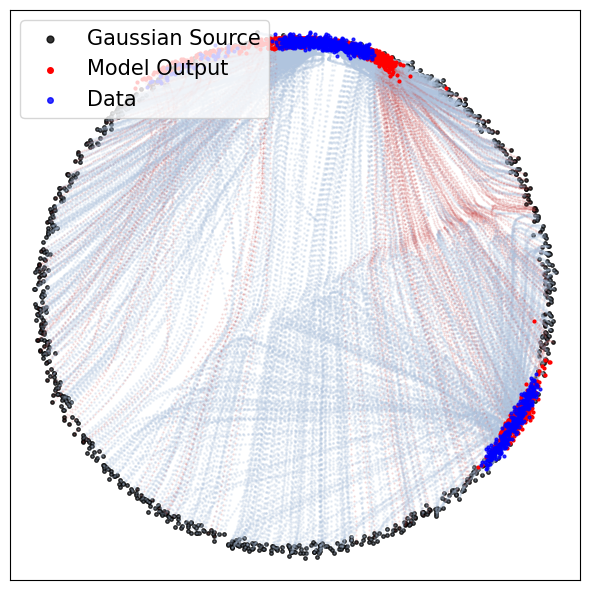

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 14958/20000 [00:57<00:08, 616.23it/s]

15000: loss 328.397 time 24.87


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 14958/20000 [01:09<00:08, 616.23it/s]

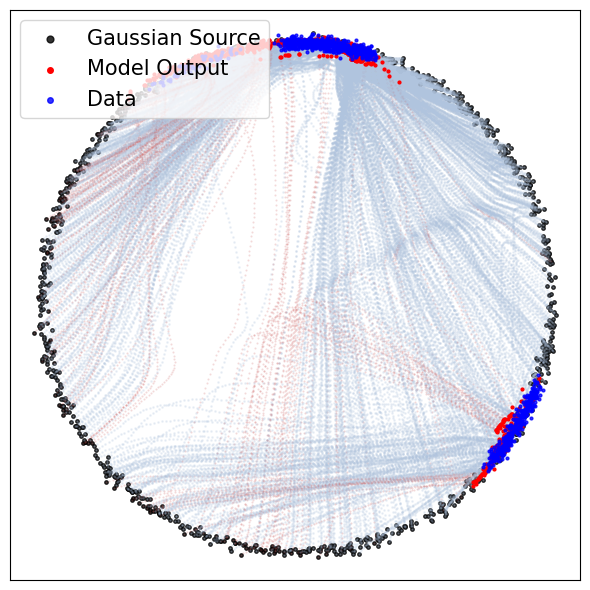

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 19954/20000 [01:22<00:00, 619.42it/s]

20000: loss 206.438 time 24.62


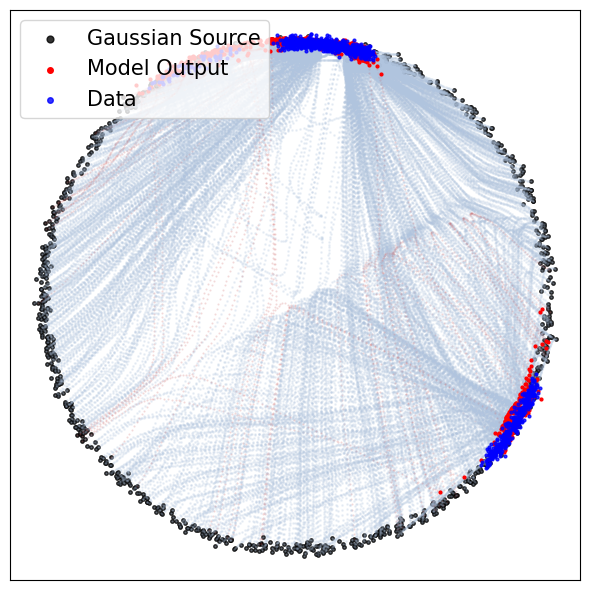

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:39<00:00, 201.69it/s]


In [ ]:
FM = ConditionalFlowMatcher(sigma=sigma)
start = time.time()
for k in tqdm(range(20000)):
    optimizer.zero_grad()

    # Sample batch indices from fixed_x1
    indices = torch.randperm(total_samples)[:batch_size]
    x0 = sample_circle(batch_size).to(device)
    x1 = fixed_x1[indices].to(device)

    t, xt, ut = FM.sample_location_and_conditional_flow(x0, x1)
    t = t.to(device)
    xt = xt.to(device)
    ut = ut.to(device)

    vt = model(torch.cat([xt, t[:, None]], dim=-1))
    loss = torch.mean((vt - ut) ** 2)

    loss.backward()
    optimizer.step()

    if (k + 1) % 5000 == 0:
        end = time.time()
        print(f"{k+1}: loss {loss.item():0.3f} time {(end - start):0.2f}")
        start = end
        node = NeuralODE(
            torch_wrapper(model), solver="dopri5", sensitivity="adjoint", atol=1e-4, rtol=1e-4
        )
        with torch.no_grad():
            traj = node.trajectory(
                sample_circle(1024).to(device),
                t_span=torch.linspace(0, 1, 100).to(device),
            )
            plot_trajectories(traj.cpu().numpy(), fixed_x1.cpu().numpy(), save_path="figure/icfm_alignment.png")
        # gen1 = traj[-1, :].cpu().numpy()
        # w2_dist = wasserstein_distance(gen1, fixed_x1.cpu().numpy())
        # print(f"Wasserstein distance: {w2_dist:.4f}")

        # with torch.no_grad():
        #     traj = node.trajectory(
        #         sample_circle_rejection(1024, pca, rejection_threshold=0.98).to(device),
        #         t_span=torch.linspace(0, 1, 100).to(device),
        #     )
        #     plot_trajectories(traj.cpu().numpy(), fixed_x1.cpu().numpy(), title="Rejection Sampling Trajectory", pca=pca)
        # gen2 = traj[-1, :].cpu().numpy()
        # w2_dist = wasserstein_distance(gen2, fixed_x1.cpu().numpy())
        # print(f"Wasserstein distance (Rejection Sampling): {w2_dist:.4f}")